In [1]:
%reload_ext autoreload
%autoreload 2

from dataset.VRP import VRPDataset

train_dataset = VRPDataset("train", n_patches=24, use_object_annotations=True)
val_dataset = VRPDataset("val", n_patches=24, use_object_annotations=True)

0 Invalid entries
0 Invalid entries


In [2]:
# from datasets import load_dataset

# # Load and download the dataset
# dataset = load_dataset("lmms-lab/llava-bench-coco")

# # Access the dataset split, if there are specific splits (like 'train' or 'test')
# print(dataset)

In [3]:
import json

# Define the path to the JSON file
json_file_path = '/u/h/k/hkhader/research/datasets/olive/COCO2017/detail_23k.json'
json_file_path2 = '/u/h/k/hkhader/research/datasets/olive/COCO2017/complex_reasoning_77k.json'

# Load the JSON file
with open(json_file_path, 'r') as file:
    detailed_captions = json.load(file)
    print("JSON data loaded successfully!")

with open(json_file_path2, 'r') as file:
    complex_reasoning = json.load(file)
    print("JSON data loaded successfully!")


JSON data loaded successfully!
JSON data loaded successfully!


In [4]:
(detailed_captions[98])

{'id': '000000249968',
 'image': '000000249968.jpg',
 'conversations': [{'from': 'human',
   'value': "What is this photo about'?\n<image>"},
  {'from': 'gpt',
   'value': 'The image depicts a city street sidewalk where two television sets and a red table are placed. The TVs are positioned next to each other, with the red table sitting in front of them. \n\nIn the background, there are multiple vehicles parked along the street, including cars, motorcycles, and a bus. Numerous people can be seen walking and standing on the sidewalk, with some close to the TVs and the red table, while others are further away. The scene overall indicates an urban environment with various objects and individuals going about their daily routines.'}]}

In [5]:
(complex_reasoning[98])

{'id': '000000566419',
 'image': '000000566419.jpg',
 'conversations': [{'from': 'human',
   'value': '<image>\nHow do people at the beach find joy despite the gloomy weather?'},
  {'from': 'gpt',
   'value': 'Despite the gloomy weather, people at the beach find joy by engaging in recreational activities like flying kites. The beach is crowded with people relaxing and socializing, and several kites are visible in the cloud-filled sky. By participating in these outdoor activities and spending quality time with friends and family, the individuals at the beach create a fun and enjoyable atmosphere even on a cloudy day. This reflects their adaptability and ability to make the most out of the situation despite unfavorable weather conditions.'}]}

In [6]:
train_dataset[0]

{'id': 9,
 'path_to_image': '/nobackup3/hkhader/datasets/olive/COCO2017/train2017/000000000009.jpg',
 'question': '[obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] Share your thoughts on the picture using these things.',
 'vit_mask': array([[1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        ...,
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0]]),
 'answer': 'A bunch of trays that have different food.',
 'bbox': [[1.08, 187.69, 611.59, 285.84],
  [311.73, 4.31, 319.28, 228.68],
  [249.6, 229.27, 316.24, 245.08],
  [0.0, 13.51, 434.48, 375.12],
  [376.2, 40.36, 75.55, 46.53],
  [465.78, 38.97, 58.07, 46.67],
  [385.7, 73.66, 84.02, 70.51],
  [364.05, 2.49, 94.76, 71.07]]}

In [7]:
val_dataset[0]

{'id': 139,
 'path_to_image': '/nobackup3/hkhader/datasets/olive/COCO2017/val2017/000000000139.jpg',
 'question': '[obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] [obj] Break down the image with these specified objects.',
 'vit_mask': array([[1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        ...,
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0]]),
 'answer': 'A living area with a television and a table',
 'bbox': [[236.98, 142.51, 24.7, 69.5],
  [7.03, 167.76, 149.32, 94.87],
  [557.21, 209.19, 81.35, 78.73],
  [358.98, 218.05, 56.0, 102.83],
  [290.69, 218.0, 61.83, 98.48],
  [413.2, 223.01, 30.17, 81.36],
  [317.4, 219.24, 21.58, 11.59],
  [412.8, 157.61, 53.05, 138.01],
  [384.43, 172.21, 15.12, 35.74],
  [512.22, 205.75, 14.74, 15.97],
  [493.1, 174.34, 20.29, 108.31],
  [604.77, 305.89, 14.34, 45.71],
  [613.24, 308.24, 

In [8]:
len(train_dataset)

103373

In [9]:
for i in range(5):
    sample = train_dataset[i]
    print(sample['answer'])

A bunch of trays that have different food.
A giraffe standing next to a forest filled with trees.
A vase with red and white flowers outside on a sunny day.
A girl in a bathing suit with a pink umbrella.
Two costumed horse riders make their horses stand on their hind legs.


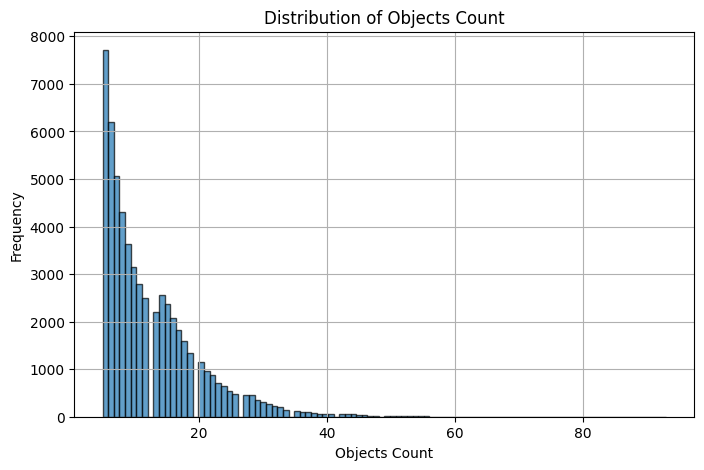

58063

In [10]:
objects_count = [len(train_dataset[i]['bbox']) for i in range(len(train_dataset))]
objects_count = [c for c in objects_count if c > 4]
import matplotlib.pyplot as plt

# Plotting the distribution
plt.figure(figsize=(8, 5))
plt.hist(objects_count, bins=100, edgecolor='black', alpha=0.7)
plt.title('Distribution of Objects Count')
plt.xlabel('Objects Count')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()
len(objects_count)

In [49]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import random
import textwrap

def show_image_boxes_and_caption(sample, caption):
    image_path = sample['path_to_image']
    image = Image.open(image_path)

    # Adjust the caption to avoid long text overflow
    wrapped_caption = "\n".join(textwrap.wrap(f"Image ID: {sample['id']} - Prediction: {caption}", width=50))

    # Create a wider figure with two subplots: one for the caption and one for the image
    fig, (ax_caption, ax_image) = plt.subplots(1, 2, figsize=(20, 10), gridspec_kw={'width_ratios': [1, 3]})

    # Add the caption in the left subplot
    ax_caption.text(0.5, 0.5, wrapped_caption,
                    ha='center', va='center', fontsize=16, wrap=True)
    ax_caption.axis('off')  # Hide axes for the caption subplot

    # Display the image on the right subplot
    ax_image.imshow(image)

    # Add bounding boxes with different colors
    for bbox in sample['bbox']:
        # COCO bounding boxes: [x_min, y_min, width, height]
        x_min, y_min, width, height = bbox

        # Generate a random color
        color = [random.random() for _ in range(3)]  # Random color in RGB

        # Create a Rectangle patch
        rect = patches.Rectangle((x_min, y_min), width, height, linewidth=3, edgecolor=color, facecolor='none')
        
        # Add the patch to the Axes
        ax_image.add_patch(rect)

    # Hide axes for the image subplot
    ax_image.axis('off')

    # Add more space between the subplots to prevent overlap
    plt.subplots_adjust(wspace=0.5)

    plt.show()


In [12]:
# from transformers import VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer
# from PIL import Image
# import torch

# # Load pre-trained image captioning model and processor from Hugging Face
# model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
# processor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
# tokenizer = AutoTokenizer.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

# # Load an image
# sample = dataset[89]
# image_path = sample['path_to_image']
# image = Image.open(image_path)

# # Preprocess the image
# pixel_values = processor(images=image, return_tensors="pt").pixel_values

# # Generate the caption
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)
# pixel_values = pixel_values.to(device)

# # Generate caption with the model
# output_ids = model.generate(pixel_values, max_length=16, num_beams=4)
# caption = tokenizer.decode(output_ids[0], skip_special_tokens=True)

# # Print the generated caption
# print("Generated Caption:", caption)

# # Plot the image using matplotlib in the Jupyter notebook
# plt.imshow(image)
# plt.axis('off')  # Hide axes
# plt.title(f"Caption: {caption}")
# plt.show()


# show_image_boxes(sample)


In [13]:
# import torch
# from transformers import BlipProcessor, BlipForConditionalGeneration
# from PIL import Image

# # Check if GPU is available and set device accordingly
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # Load the model and processor
# model_name = "Salesforce/blip-image-captioning-base"
# processor = BlipProcessor.from_pretrained(model_name)
# model = BlipForConditionalGeneration.old_confige device (GPU or CPU)
# model.to(device)

# # Load your image
# image_path = sample['path_to_image']
# image = Image.open(image_path)

# # Process the image and move inputs to the appropriate device
# inputs = processor(image, return_tensors="pt").to(device)

# # Generate the caption with longer output settings
# with torch.no_grad():
#     output = model.generate(
#         **inputs,
#         max_length=50,      # Increase max length to generate longer captions
#         num_beams=5,        # Use beam search for better quality
#         no_repeat_ngram_size=2,  # Prevent repetition
#         early_stopping=True  # Stop generation when the end is reached
#     )

# # Decode the generated caption
# caption = processor.decode(output[0], skip_special_tokens=True)

# print("Generated Caption:", caption)

In [14]:
def create_it_map(data_list):
    id_to_sample = dict( (int(sample["id"]), sample) for sample in data_list)
    return id_to_sample

create_it_map(train_dataset).keys()
    

dict_keys([9, 25, 30, 36, 49, 61, 64, 71, 72, 73, 74, 77, 86, 89, 92, 94, 109, 110, 113, 127, 133, 136, 138, 142, 143, 144, 149, 151, 154, 164, 165, 192, 194, 196, 201, 208, 241, 247, 257, 260, 263, 283, 294, 307, 308, 309, 312, 315, 321, 322, 326, 328, 332, 338, 349, 357, 359, 360, 368, 370, 382, 384, 387, 389, 394, 395, 397, 400, 404, 415, 419, 428, 431, 436, 438, 443, 446, 450, 459, 471, 474, 486, 488, 490, 491, 510, 520, 529, 531, 532, 536, 540, 542, 544, 560, 562, 564, 569, 572, 584, 589, 590, 597, 599, 605, 612, 620, 623, 625, 626, 634, 641, 643, 650, 656, 659, 661, 670, 673, 675, 684, 690, 692, 693, 699, 711, 714, 715, 716, 722, 723, 730, 731, 735, 754, 757, 761, 762, 764, 772, 775, 781, 790, 795, 797, 801, 810, 813, 821, 828, 831, 836, 839, 853, 882, 897, 901, 902, 908, 909, 913, 923, 925, 927, 934, 939, 941, 943, 955, 960, 962, 965, 969, 974, 977, 984, 985, 987, 996, 999, 1006, 1011, 1014, 1036, 1053, 1064, 1083, 1085, 1089, 1098, 1099, 1102, 1103, 1107, 1108, 1122, 1138, 1139

In [15]:
ids_detailed = create_it_map(detailed_captions)
ids_complex = create_it_map(complex_reasoning)
ids_train_dataset = create_it_map(train_dataset)
ids_val_dataset = create_it_map(val_dataset)

print(len(ids_detailed))
print(len((set(ids_detailed) & set(ids_train_dataset))))
print(len((set(ids_complex) & set(ids_train_dataset))))
print(len((set(ids_detailed) & set(ids_val_dataset))))
print(len((set(ids_complex) & set(ids_val_dataset))))
print(len(((set(ids_detailed) |  set(ids_complex))& set(ids_train_dataset))))
print(len((set(ids_complex) & set(ids_detailed))))
"len of train {}".format(len(ids_train_dataset))

23240
23240
67264
0
0
69347
21157


'len of train 103373'

In [16]:
def show_image_with_id(id):
    for sample in dataset:
        if int(sample['id']) == int(id):
            found = sample
            break
    show_image_boxes(found)
    print(found)

In [17]:
len(val_dataset)

4359

In [33]:
val_short_captions = 'outputs/image_captioning/gpt2_finetuned_llm_clip_336_object_level_annotations_24x24_patches.pkl'
val_long_captions = 'outputs/image_captioning/gpt2_detailed_dataset_all_trainfinetuned_llm_clip_336_object_level_annotations_24x24_patches.pkl'
val_long_captions_classification_and_captioning = '/u/h/k/hkhader/research/OLIVE/outputs/classification_and_detailed_image_captioning/gpt2_classification_and_detailed_image_captioningfinetuned_llm_clip_336_24x24_patches.pkl'
import pickle
with open(val_long_captions_classification_and_captioning, 'rb') as file:
    data = pickle.load(file)
len(data)

4359

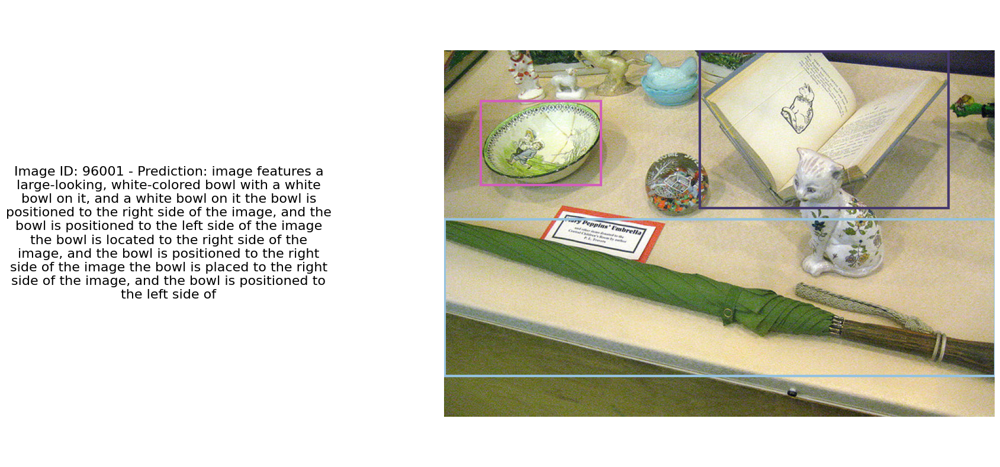

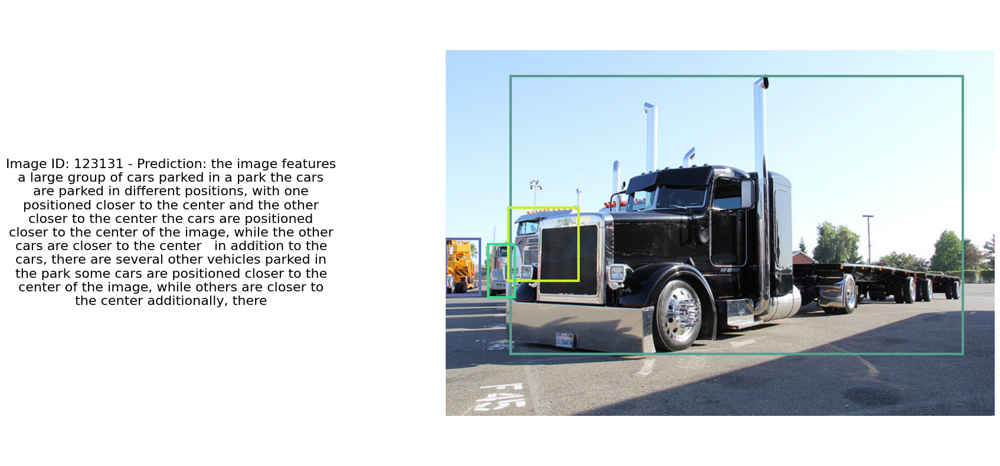

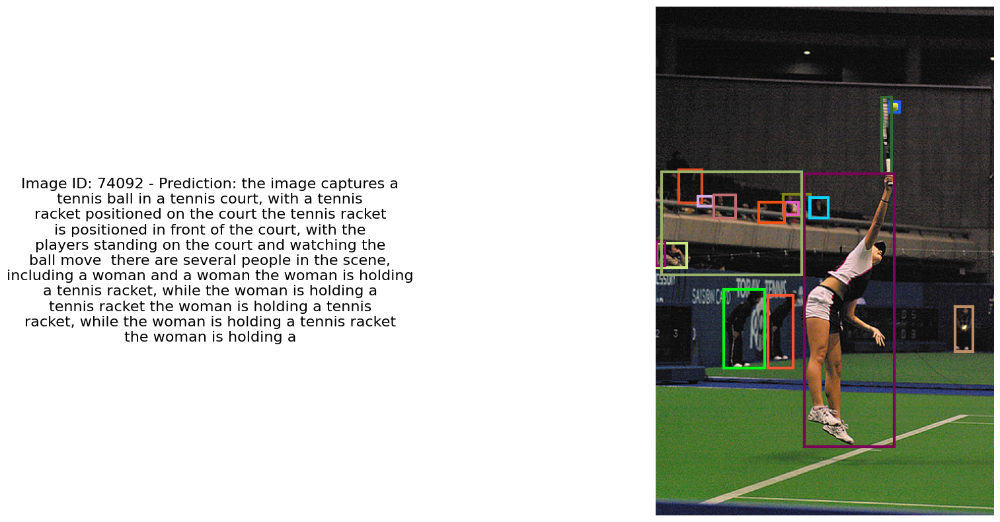

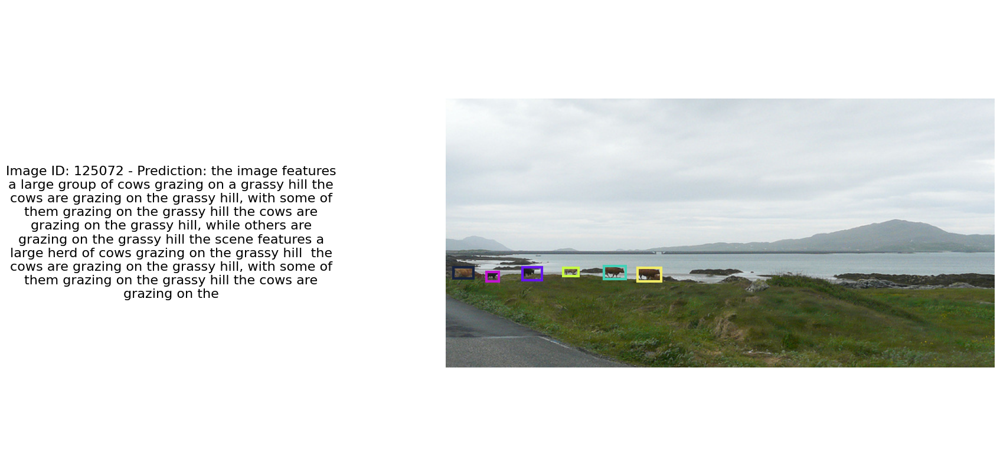

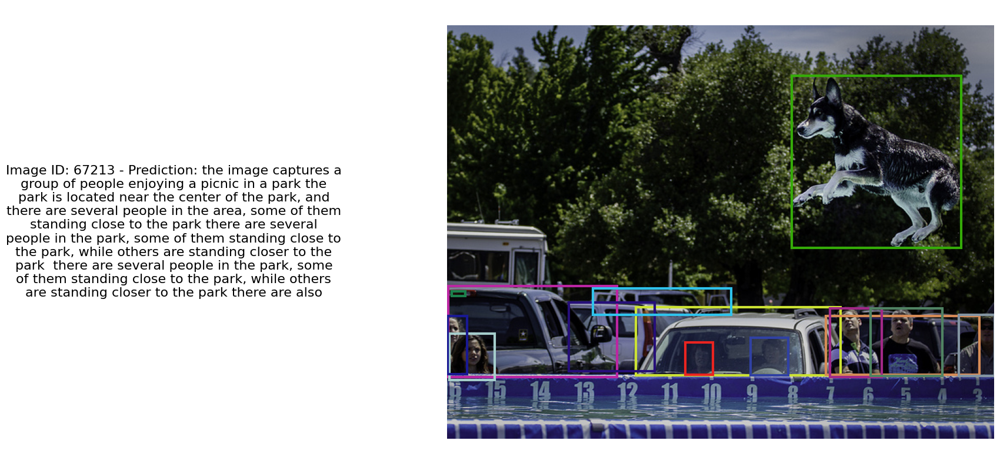

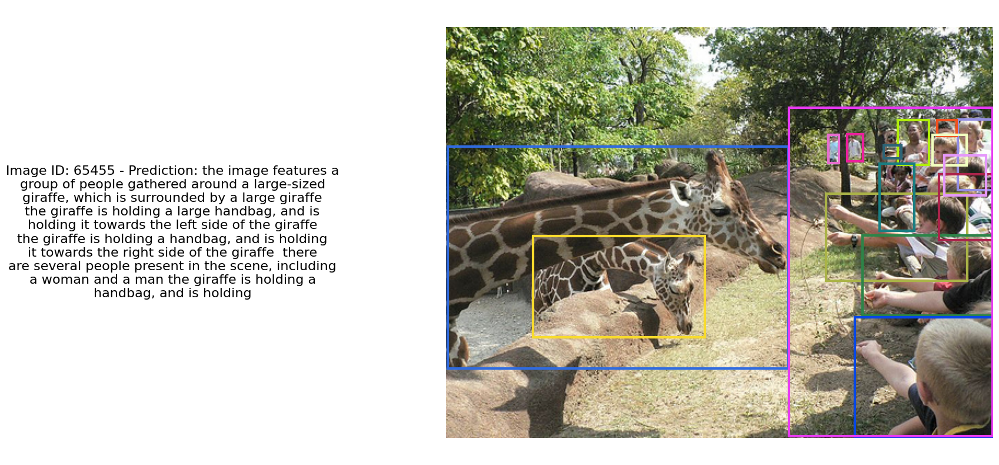

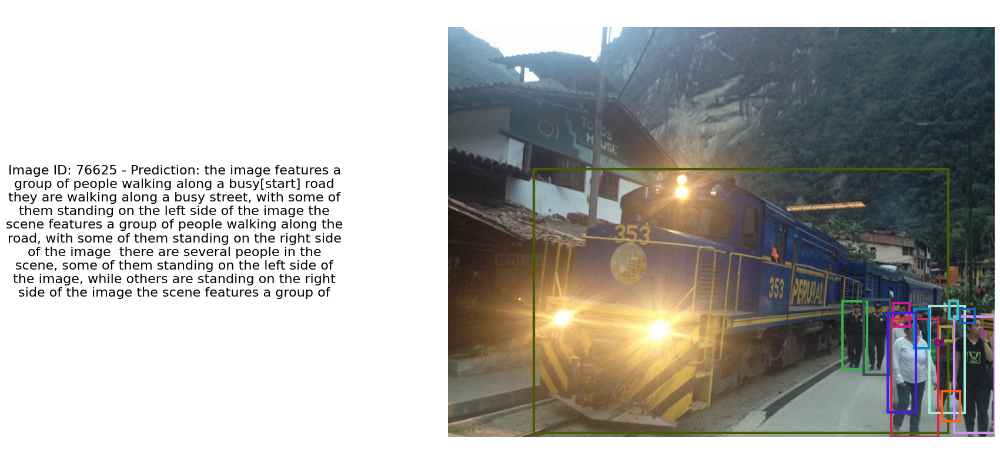

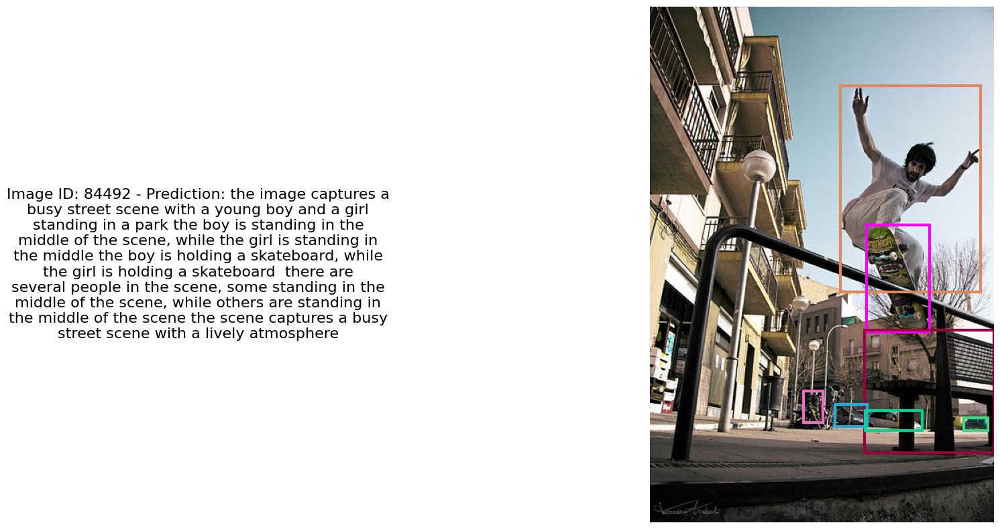

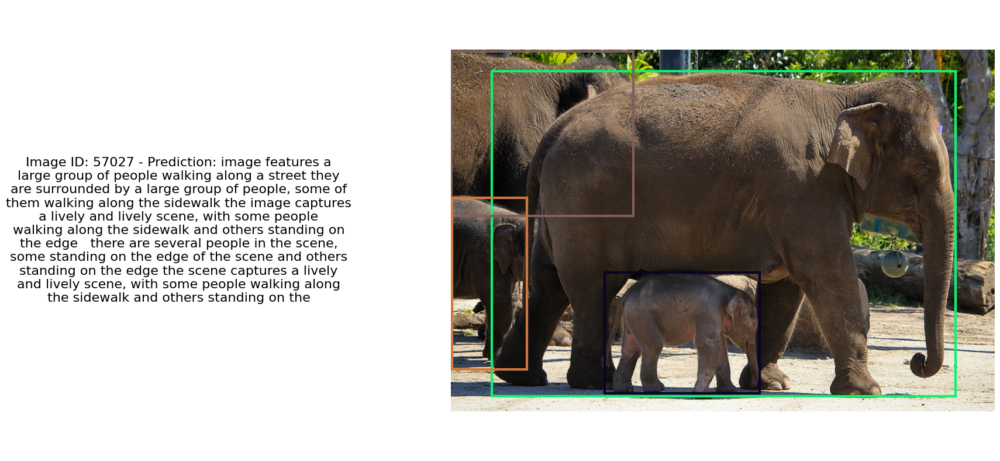

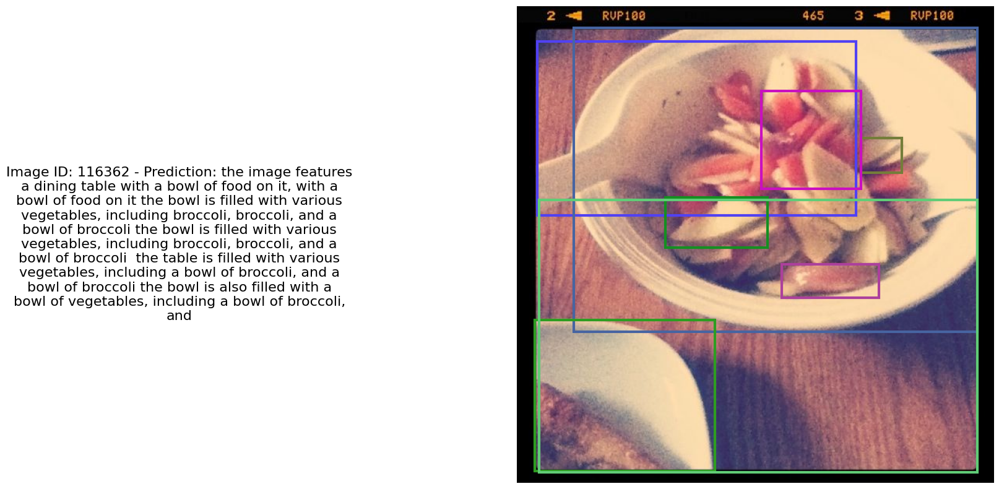

In [56]:
# good 28

import random
for _ in range(10):

    id = random.randint(1, 1000)
    show_image_boxes_and_caption(ids_val_dataset[data[id]['id']], data[id]['prediction'])
    data[id]

In [20]:
show_image_boxes(ids_val_dataset[data[36]['id']])

NameError: name 'show_image_boxes' is not defined

In [21]:
# from dataset.objectCOCO import COCOObjectDataset
# # Load and slice the datasets to get 10 samples each
# dataset2 = VRPDataset("train", n_patches=24, use_object_annotations=True, long_answers=True)


In [22]:
# import torch
# from torch.utils.data import DataLoader


# dataset1 =  VRPDataset("train", n_patches=24, use_object_annotations=True, long_answers=True)
# dataset2 =  VRPDataset("train", n_patches=24, use_object_annotations=True, long_answers=True)



In [23]:
# random.shuffle(dataset1.entries)
# random.shuffle(dataset2.entries)

# dataset2.entries = dataset1.entries[:10] + dataset2.entries[:10]
# dataset = dataset2
            
# train_loader = DataLoader(dataset, 24, shuffle=False, num_workers=2, collate_fn=dataset.collate_fn)

NameError: name 'dataset1' is not defined

In [59]:
len(dataset)

20